In [1]:
from ucimlrepo import fetch_ucirepo # to import data from UCI ML repository
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler # from KNN1 Lab
%matplotlib inline

In [2]:
# fetch dataset 
predict_students_dropout_and_academic_success = fetch_ucirepo(id=697) 

# data (as pandas dataframes) 
X = predict_students_dropout_and_academic_success.data.features 
y = predict_students_dropout_and_academic_success.data.targets 

df = pd.concat([X, y], axis=1)
  
df.head()

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate


In [3]:
y.head()

,Target
0,Dropout
1,Graduate
2,Dropout
3,Graduate
4,Graduate


In [5]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 36 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital Status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance                      4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                   

# Data Dictionary [Demographic]<br>

#### Marital Status [Marital Status]<br>
1. Single<br>
2. Married<br>
3. Widower<br>
4. Divorced<br>
5. De facto union<br>
6. Legally separated<br>

#### Application mode<br>
1 - 1st phase general contingent<br>
2 - Ordinance No. 612/93<br>
5 - 1st phase special contigent (Azores Island)<br>
7 - Holders of other higher courses<br>
10 - Ordinance No. 854-B/99<br>
15 - International Student (Bachelor)<br>
16 - 1st phase special contingent (Madeira Island)<br>
17 - 2nd phase general contingent<br>
18 - 3rd phase general contingent<br>
26 - Ordinance No. 533-A/99, item b2<br>
27 - Ordinance No. 533-A/99, item b3<br>
39 - Over 23 years old<br>
42 - Transfer<br>
43 - Change of course<br>
44 - Technological specialization diploma holders<br>
51 - Change of institution/course<br>
53 - Short cycle diploma holders<br>
57 - Change of institution/course (International)<br>

#### Application order<br>
0 - First choice<br>
...<br>
9 - Last choice<br>

#### Course<br>
33 - Biofuel Production Technologies<br>
171 - Animation and Multimedia Design<br>
8014 - Social Service (evening attendance)<br>
9003 - Agronomy<br>
9070 - Communication design<br>
9085 - Veterinary Nursing<br>
9119 - Informatics Engineering<br>
9130 - Equinculture<br>
9147 - Management<br>
9238 - Social Service<br>
9254 - Tourism<br>
9500 - Nursing<br>
9556 - Oral Hygiene<br>
9670 - Advertising and Marketing Management<br>
9773 - Journalism and Communication<br>
9853 - Basic Education<br>
9991 - Management (evening attendance)<br>

#### Daytime/evening attendance<br>
1 - daytime<br>
0 - evening<br>

#### Previous qualification [Education Level]<br>
1 - Secondary education<br>
2 - Higher education - Bachelor's degree<br>
3 - Higher education - degree<br>
4 - Higher education - Master's<br>
5 - Higher education - Doctorate<br>
6 - Frequency of higher education<br>
9 - 12th year of schooling - not completed<br>
10 - 11th year of schooling - not completed<br>
12 - Other - 11th year of schooling<br>
14 - 10th year of schooling<br>
15 - 10th year of schooling - not completed<br>
19 - Basic education 3rd cycle (9th/10th/11th year) or equiv.<br>
38 - Basic education 2nd cycle (6th/7th/8th year) or equiv.<br>
39 - Technological specialization course<br>
40 - Higher education - degree (1st cycle)<br>
42 - Professional higher technical course<br>
43 - Higher education - Master (2nd cycle)<br>

#### Previous qualification (grade)<br>
[0, 200] - Grade of previous qualification<br>

#### Nacionality [Nationality]<br>
1 - Portuguese<br>
2 - German<br>
6 - Spanish<br>
11 - Italian<br>
13 - Dutch<br>
14 - English<br>
17 - Lithuanian<br>
21 - Angolan<br>
22 - Cape Verdean<br>
24 - Guinean<br>
25 - Mozambican<br>
26 - Santomean<br>
32 - Turkish<br>
41 - Brazilian<br>
62 - Romanian<br>
100 - Moldova (Republic of)<br>
101 - Mexican<br>
103 - Ukrainian<br>
105 - Russian<br>
108 - Cuban<br>
109 - Colombian<br>

#### Mother's qualification [Education Level]<br>
1 - Secondary education - 12th year of schooling or equiv.<br>
2 - Higher education - Bachelor's degree<br>
3 - Higher education - degree<br>
4 - Higher education - Master's<br>
5 - Higher education - Doctorate<br>
6 - Frequency of Higher education<br>
9 - 12th year of schooling - not completed<br>
10 - 11th year of schooling - not completed<br>
11 - 7th year (Old)<br>
12 - Other - 11th year of schooling<br>
14 - 10th year of schooling<br>
18 - General commerce course<br>
19 - Basic education 3rd cycle (9th/10th/11th year) or equiv.<br>
22 - Technical-professional course<br>
26 - 7th year of schooling<br>
27 - 2nd cycle of the general high school course<br>
29 - 9th year of schooling - not completed<br>
30 - 8th year of schooling<br>
34 - Unknown<br>
35 - Can't read or write<br>
36 - Can read without having a 4th year of schooling<br>
37 - Basic education 1st cycle (4th/5th year) or equiv.<br>
38 - Basic education 2nd cycle (6th/7th/8th year) or equiv.<br>
39 - Technological specialization course<br>
40 - Higher education - degree (1st cycle)<br>
41 - Specialized higher studies course <br>
42 - Professional higher technical course<br>
43 - Higher education - Master (2nd cycle)<br>
44 - Higher education - Doctorate (3rd cycle)<br>

#### Father's qualification [Education Level]<br>
1 - Secondary Education - 12th Year of Schooling or Eq.<br>
2 - Higher Education - Bachelor's Degree <br>
3 - Higher Education - Degree <br>
4 - Higher Education - Master's <br>
5 - Higher Education - Doctorate <br>
6 - Frequency of Higher Education <br>
9 - 12th Year of Schooling - Not Completed <br>
10 - 11th Year of Schooling - Not Completed <br>
11 - 7th Year (Old) <br>
12 - Other - 11th Year of Schooling <br>
13 - 2nd year complementary high school course <br>
14 - 10th Year of Schooling <br>
18 - General commerce course <br>
19 - Basic Education 3rd Cycle (9th/10th/11th Year) or Equiv. <br>
20 - Complementary High School Course <br>
22 - Technical-professional course <br>
25 - Complementary High School Course - not concluded <br>
26 - 7th year of schooling <br>
27 - 2nd cycle of the general high school course <br>
29 - 9th Year of Schooling - Not Completed <br>
30 - 8th year of schooling <br>
31 - General Course of Administration and Commerce <br>
33 - Supplementary Accounting and Administration <br>
34 - Unknown <br>
35 - Can't read or write <br>
36 - Can read without having a 4th year of schooling <br>
37 - Basic education 1st cycle (4th/5th year) or equiv. <br>
38 - Basic Education 2nd Cycle (6th/7th/8th Year) or Equiv. <br>
39 - Technological specialization course <br>
40 - Higher education - degree (1st cycle) <br>
41 - Specialized higher studies course <br>
42 - Professional higher technical course <br>
43 - Higher Education - Master (2nd cycle) <br>
44 - Higher Education - Doctorate (3rd cycle)<br>

#### Mother's occupation [Occupation]

0 - Student <br>
1 - Representatives of the Legislative Power and Executive Bodies, Directors, Directors, and Executive Managers <br>
2 - Specialists in Intellectual and Scientific Activities <br>
3 - Intermediate Level Technicians and Professions <br>
4 - Administrative staff <br>
5 - Personal Services, Security and Safety Workers and Sellers <br>
6 - Farmers and Skilled Workers in Agriculture, Fisheries and Forestry <br>
7 - Skilled Workers in Industry, Construction and Craftsmen <br>
8 - Installation and Machine Operators and Assembly Workers <br>
9 - Unskilled Workers <br>
10 - Armed Forces Professions <br>
90 - Other Situation <br>
99 - (blank) <br>
122 - Health professionals <br>
123 - teachers <br>
125 - Specialists in information and communication technologies (ICT) <br>
131 - Intermediate level science and engineering technicians and professions <br>
132 - Technicians and professionals, of intermediate level of health <br>
134 - Intermediate level technicians from legal, social, sports, cultural and similar services <br>
141 - Office workers, secretaries in general and data processing operators <br>
143 - Data, accounting, statistical, financial services, and registry-related operators <br>
144 - Other administrative support staff <br>
151 - personal service workers <br>
152 - sellers <br>
153 - Personal care workers and the like <br>
171 - Skilled construction workers and the like, except electricians <br>
173 - Skilled workers in printing, precision instrument manufacturing, jewelers, artisans, and the like <br>
175 - Workers in food processing, woodworking, clothing and other industries and crafts <br>
191 - cleaning workers <br>
192 - Unskilled workers in agriculture, animal production, fisheries, and forestry <br>
193 - Unskilled workers in extractive industry, construction, manufacturing, and transport <br>
194 - Meal preparation assistants<br>

#### Father's occupation [Occupation]

0 - Student <br>
1 - Representatives of the Legislative Power and Executive Bodies, Directors, Directors, and Executive Managers <br>
2 - Specialists in Intellectual and Scientific Activities <br>
3 - Intermediate Level Technicians and Professions <br>
4 - Administrative staff <br>
5 - Personal Services, Security and Safety Workers and Sellers <br>
6 - Farmers and Skilled Workers in Agriculture, Fisheries and Forestry <br>
7 - Skilled Workers in Industry, Construction and Craftsmen <br>
8 - Installation and Machine Operators and Assembly Workers <br>
9 - Unskilled Workers <br>
10 - Armed Forces Professions <br>
90 - Other Situation <br>
99 - (blank) <br>
101 - Armed Forces Officers <br>
102 - Armed Forces Sergeants <br>
103 - Other Armed Forces personnel <br>
112 - Directors of administrative and commercial services <br>
114 - Hotel, catering, trade, and other services directors <br>
121 - Specialists in the physical sciences, mathematics, engineering, and related techniques <br>
122 - Health professionals <br>
123 - teachers <br>
124 - Specialists in finance, accounting, administrative organization, public and commercial relations <br>
131 - Intermediate level science and engineering technicians and professions <br>
132 - Technicians and professionals, of intermediate level of health <br>
134 - Intermediate level technicians from legal, social, sports, cultural and similar services <br>
135 - Information and communication technology technicians <br>
141 - Office workers, secretaries in general and data processing operators <br>
143 - Data, accounting, statistical, financial services, and registry-related operators <br>
144 - Other administrative support staff <br>
151 - personal service workers <br>
152 - sellers <br>
153 - Personal care workers and the like <br>
154 - Protection and security services personnel <br>
161 - Market-oriented farmers and skilled agricultural and animal production workers <br>
163 - Farmers, livestock keepers, fishermen, hunters and gatherers, subsistence <br>
171 - Skilled construction workers and the like, except electricians <br>
172 - Skilled workers in metallurgy, metalworking and similar <br>
174 - Skilled workers in electricity and electronics <br>
175 - Workers in food processing, woodworking, clothing and other industries and crafts <br>
181 - Fixed plant and machine operators <br>
182 - assembly workers <br>
183 - Vehicle drivers and mobile equipment operators <br>
192 - Unskilled workers in agriculture, animal production, fisheries, and forestry <br>
193 - Unskilled workers in extractive industry, construction, manufacturing, and transport <br>
194 - Meal preparation assistants <br>
195 - Street vendors (except food) and street service providers<br>

#### Admission grade

[0, 200] - Admission grade (between 0 and 200, continuous)<br>

#### Displaced

1 - yes<br>
0 - no<br>

#### Educational special needs

1 - yes<br>
0 - no<br>

#### Debtor

1 - yes<br>
0 - no<br>

#### Tuition fees up to date

1 - yes<br>
0 - no<br>

#### Gender [Gender]

1 - male<br>
0 - female<br>

#### Scholarship holder

1 - yes<br>
0 - no<br>

#### Age at enrollment

[17, 70] - Age of student at enrollment (integer)

#### International

1 - yes<br>
0 - no<br>

#### Curricular units 1st sem (credited)

[0, 20] - Number of curricular units credited in 1st semester (integer)

#### Curricular units 1st sem (enrolled)

[0, 26] - Number of units enrolled in 1st semester (integer)

#### Curricular units 1st sem (evaluations)

[0, 45] - Number of evaluations to curricular units in the 1st semester (integer)

#### Curricular units 1st sem (approved)

[0, 26] - Number of curricular units approved in the 1st semester (integer)

#### Curricular units 1st sem (grade)

[0, 18.875] - Grade average in the 1st semester (continuous)

#### Curricular units 1st sem (without evaluations)

[0, 12] - Number of curricular units without evaluations in the 1st semester (integer)

#### Curricular units 2nd sem (credited)

[0, 19] - Number of curricular units credited in the 2nd semester (integer)

#### Curricular units 2nd sem (enrolled)

[0, 23] - Number of curricular units enrolled in the 2nd semester (integer)

#### Curricular units 2nd sem (evaluations)

[0, 33] - Numer of evaluations to curricular units in the 2nd semester (integer)

#### Curricular units 2nd sem (approved)

[0, 20] - Number of curricular units approved in the 2nd semester (integer)

#### Curricular units 2nd sem (grade)

[0, 18.57] - Grade average in the 2nd semester (continuous)

#### Curricular units 2nd sem (without evaluations)

[0, 12] - Number of curricular units without evaluations in the 2nd semester (integer)

#### Unemployment rate

[7.6, 16.2] - Percent unemployed (continuous)

#### Inflation rate

[-.8, 3.7] - Percent change in inflation (continuous)

#### GDP

[-4.06, 3.51] - Percent change in GDP (continuous)

#### Target

3 Levels: `Dropout`,`Enrolled`,`Graduated`

### Variables to convert to disjoint coding

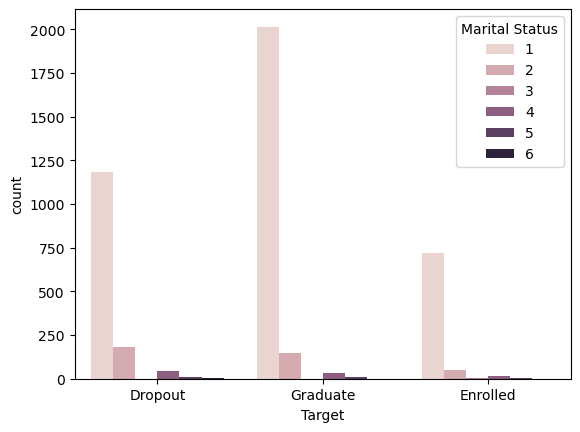

In [6]:
X['Marital Status'].value_counts()
#sns.countplot(x='Marital Status',data=X)

sns.countplot(x='Target',data=df,hue='Marital Status')
plt.show()

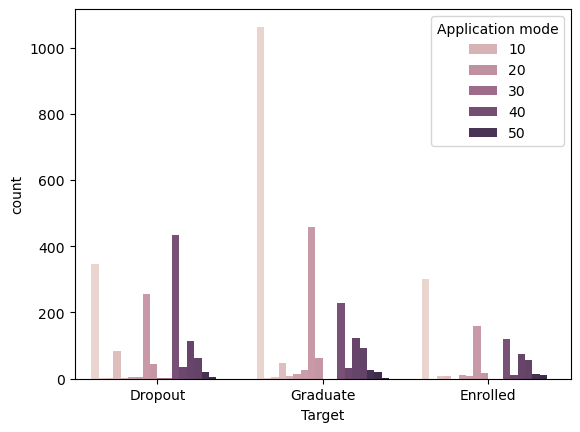

In [7]:
X['Application mode'].value_counts()

sns.countplot(x='Target',data=df,hue='Application mode', legend='brief')
plt.show()

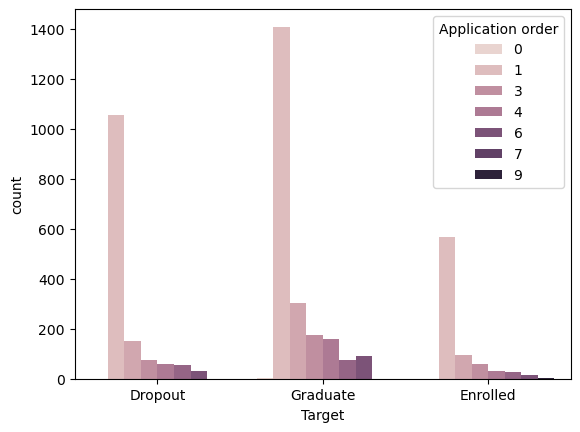

In [8]:
X['Application order'].value_counts()

sns.countplot(x='Target',data=df,hue='Application order')
plt.show()

In [9]:
X['Course'].value_counts()

9500    766
9147    380
9238    355
9085    337
9773    331
9670    268
9991    268
9254    252
9070    226
171     215
8014    215
9003    210
9853    192
9119    170
9130    141
9556     86
33       12
Name: Course, dtype: int64

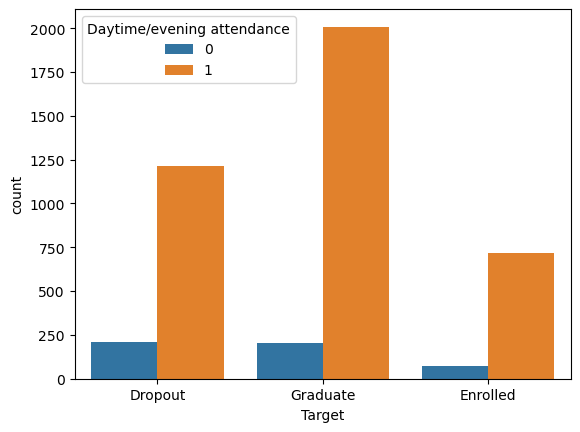

In [10]:
X['Daytime/evening attendance'].value_counts()

sns.countplot(x='Target',data=df,hue='Daytime/evening attendance')
plt.show()

In [11]:
X['Previous qualification'].value_counts()

1     3717
39     219
19     162
3      126
12      45
40      40
42      36
2       23
6       16
9       11
4        8
38       7
43       6
10       4
15       2
5        1
14       1
Name: Previous qualification, dtype: int64

In [12]:
X['Nacionality'].value_counts()

1      4314
41       38
26       14
22       13
6        13
24        5
100       3
11        3
103       3
21        2
101       2
62        2
25        2
2         2
105       2
32        1
13        1
109       1
108       1
14        1
17        1
Name: Nacionality, dtype: int64

In [13]:
X["Mother's qualification"].value_counts()

1     1069
37    1009
19     953
38     562
3      438
34     130
2       83
4       49
12      42
5       21
40       9
9        8
39       8
41       6
6        4
42       4
43       4
29       3
10       3
11       3
36       3
35       3
30       3
14       2
18       1
22       1
27       1
26       1
44       1
Name: Mother's qualification, dtype: int64

In [14]:
X["Father's qualification"].value_counts()

37    1209
19     968
1      904
38     702
3      282
34     112
2       68
4       39
12      38
39      20
5       18
11      10
36       8
9        5
40       5
22       4
30       4
14       4
29       3
35       2
41       2
43       2
10       2
6        2
26       2
25       1
27       1
33       1
44       1
20       1
42       1
18       1
13       1
31       1
Name: Father's qualification, dtype: int64

In [15]:
X["Mother's occupation"].value_counts()

9      1577
4       817
5       530
3       351
2       318
7       272
0       144
1       102
6        91
90       70
8        36
191      26
99       17
194      11
141       8
123       7
144       6
175       5
192       5
193       4
134       4
10        4
143       3
151       3
132       3
152       2
122       2
153       2
173       1
125       1
131       1
171       1
Name: Mother's occupation, dtype: int64

In [16]:
X["Father's occupation"].value_counts()

9      1010
7       666
5       516
4       386
3       384
8       318
10      266
6       242
2       197
1       134
0       128
90       65
99       19
193      15
144       8
171       8
192       6
163       5
103       4
175       4
135       3
183       3
152       3
123       3
181       3
194       2
182       2
112       2
151       2
172       2
122       2
102       2
153       1
101       1
114       1
174       1
141       1
132       1
134       1
143       1
131       1
161       1
195       1
121       1
124       1
154       1
Name: Father's occupation, dtype: int64

<Axes: xlabel='Admission grade', ylabel='Count'>

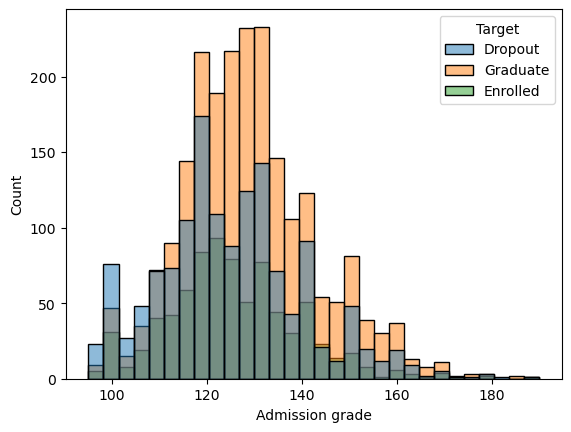

In [17]:
sns.histplot(data=df, x='Admission grade', hue='Target',bins=30)

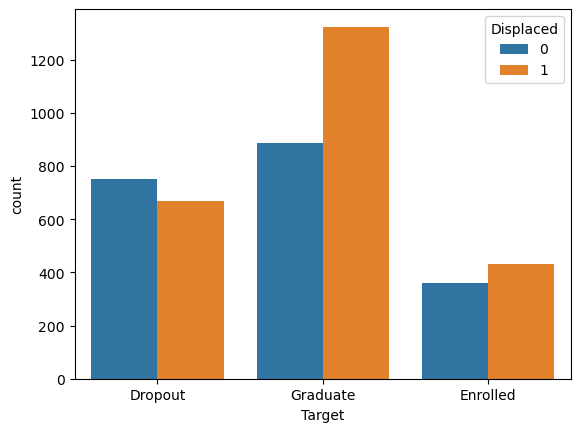

In [18]:
df['Displaced'].value_counts()

sns.countplot(x='Target',data=df,hue='Displaced')
plt.show()

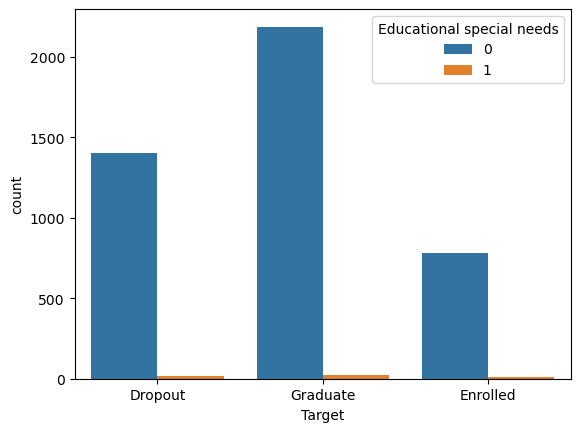

In [19]:
df['Educational special needs'].value_counts()

sns.countplot(x='Target',data=df,hue='Educational special needs')
plt.show()

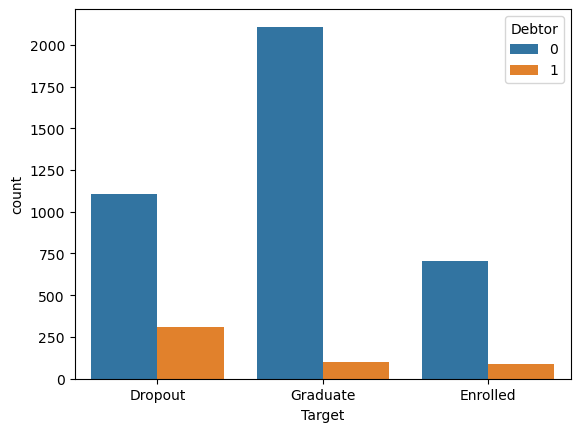

In [20]:
df['Debtor'].value_counts()

sns.countplot(x='Target',data=df,hue='Debtor')
plt.show()

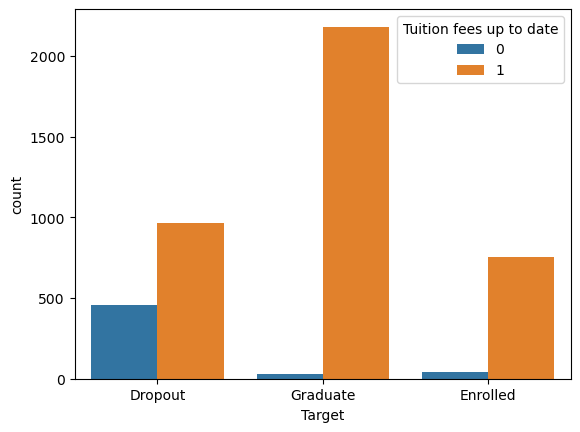

In [21]:
df['Tuition fees up to date'].value_counts()


sns.countplot(x='Target',data=df,hue='Tuition fees up to date')
plt.show()

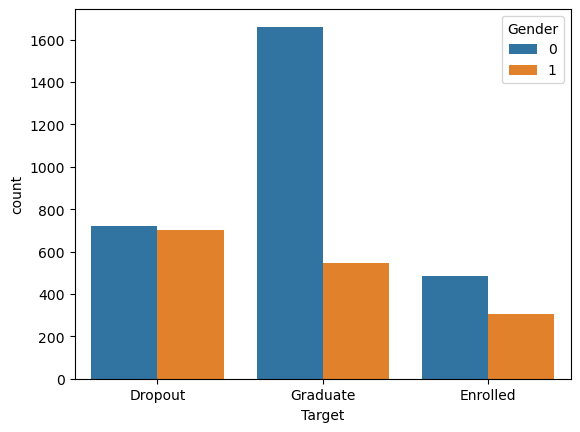

In [22]:
df['Gender'].value_counts()


sns.countplot(x='Target',data=df,hue='Gender')
plt.show()

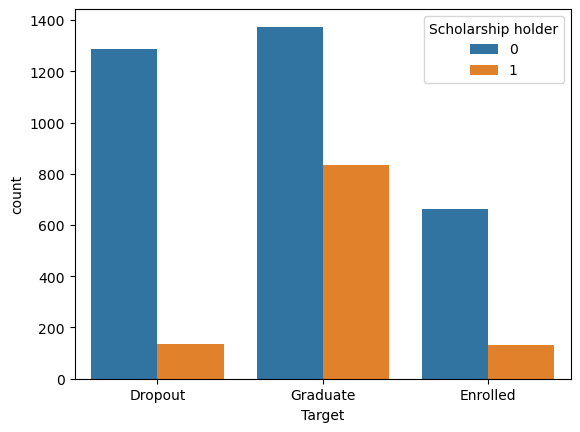

In [23]:
df['Scholarship holder'].value_counts()


sns.countplot(x='Target',data=df,hue='Scholarship holder')
plt.show()

<Axes: xlabel='Age at enrollment', ylabel='Count'>

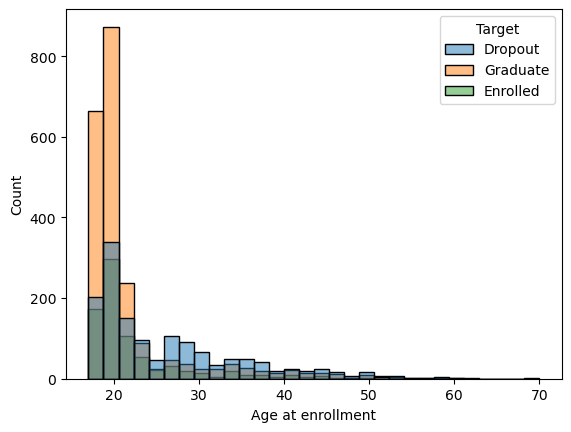

In [24]:
sns.histplot(data=df, x='Age at enrollment', hue='Target', bins=30)

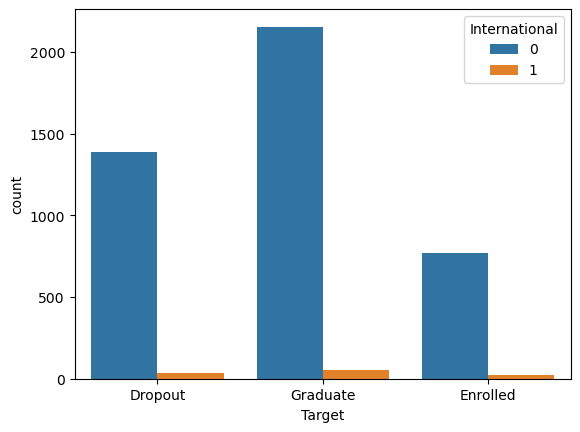

In [25]:
df['International'].value_counts()

sns.countplot(x='Target',data=df,hue='International')
plt.show()

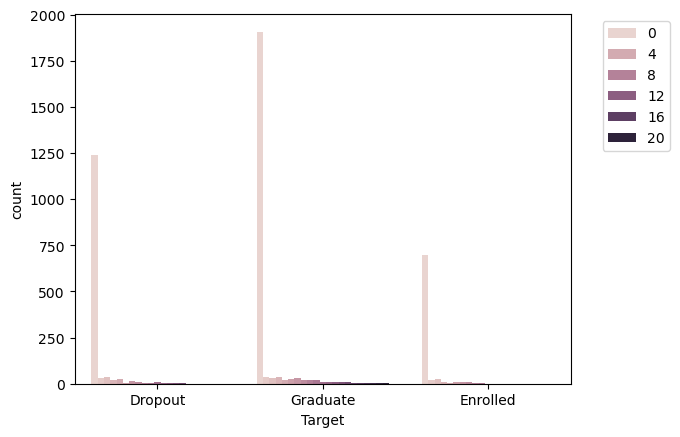

In [26]:
df['Curricular units 1st sem (credited)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 1st sem (credited)')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

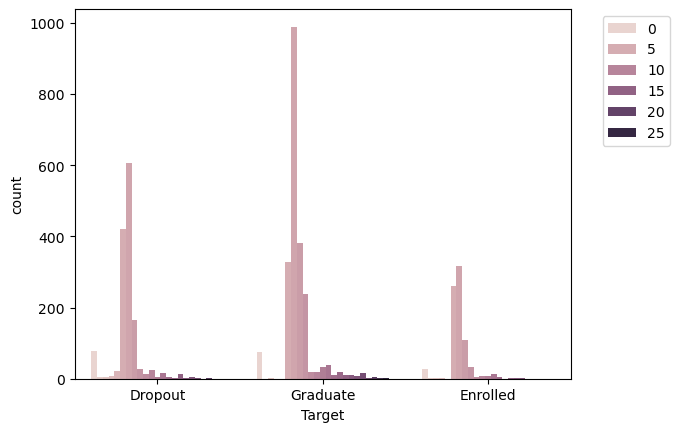

In [27]:
df['Curricular units 1st sem (enrolled)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 1st sem (enrolled)')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Axes: xlabel='Curricular units 1st sem (evaluations)', ylabel='Count'>

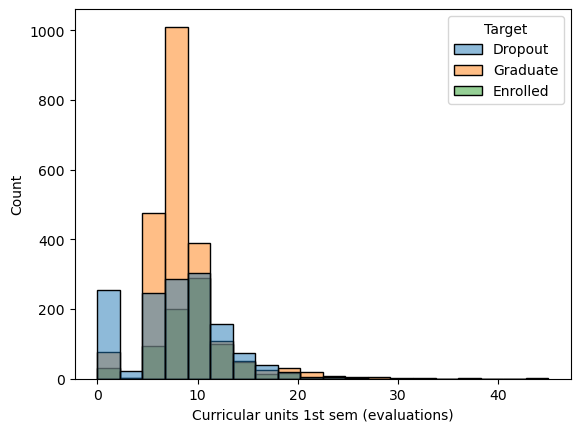

In [28]:
df['Curricular units 1st sem (evaluations)'].value_counts()

#sns.countplot(x='Target',data=df,hue='Curricular units 1st sem (evaluations)', legend='full')
#plt.show()

sns.histplot(data=df, x='Curricular units 1st sem (evaluations)', hue='Target', bins = 20)

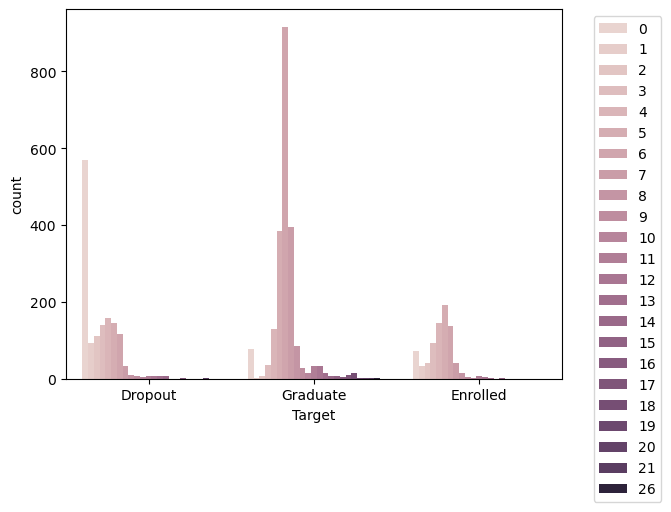

In [29]:
df['Curricular units 1st sem (approved)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 1st sem (approved)', legend='full')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#sns.histplot(data=df, x='Curricular units 1st sem (approved)', hue='Target', bins = 20)

<Axes: xlabel='Curricular units 1st sem (grade)', ylabel='Count'>

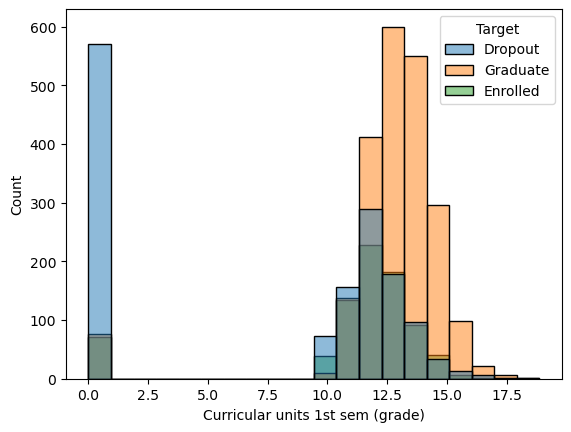

In [30]:
df['Curricular units 1st sem (grade)'].value_counts()

sns.histplot(data=df, x='Curricular units 1st sem (grade)', hue='Target', bins = 20)

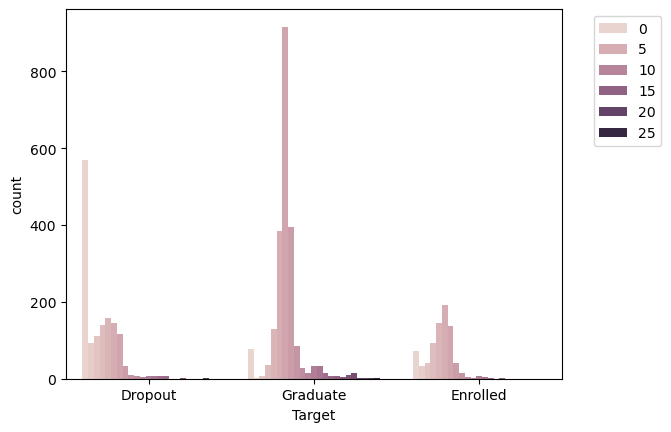

In [31]:
df['Curricular units 1st sem (without evaluations)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 1st sem (approved)', legend='auto')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

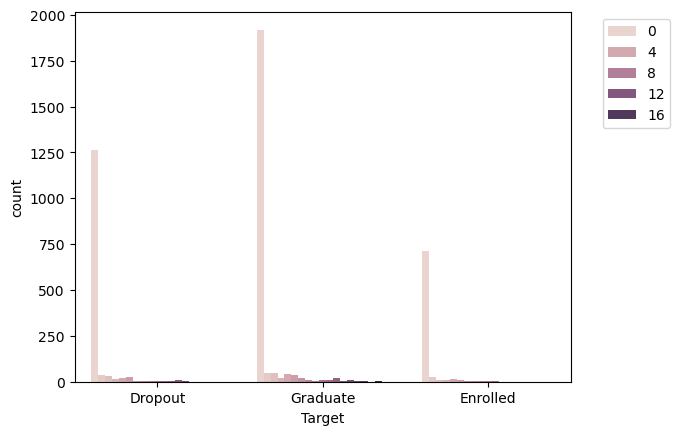

In [32]:
df['Curricular units 2nd sem (credited)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 2nd sem (credited)')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

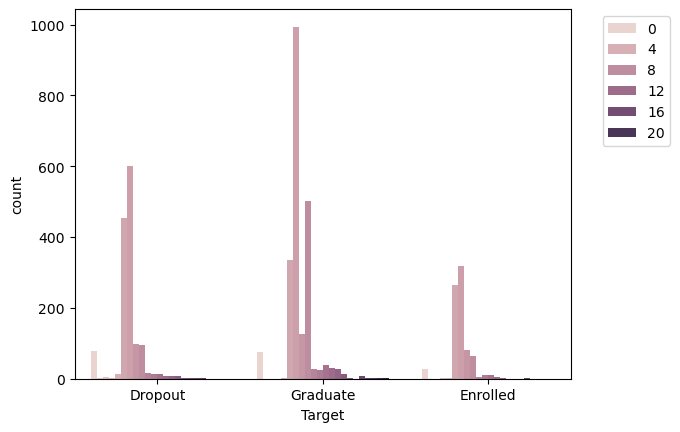

In [33]:
df['Curricular units 2nd sem (enrolled)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 2nd sem (enrolled)')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Axes: xlabel='Curricular units 2nd sem (evaluations)', ylabel='Count'>

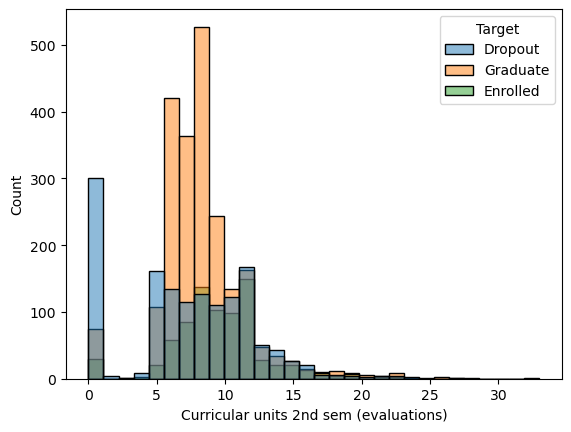

In [34]:
df['Curricular units 2nd sem (evaluations)'].value_counts()

sns.histplot(data=df, x='Curricular units 2nd sem (evaluations)', hue='Target', bins = 30)

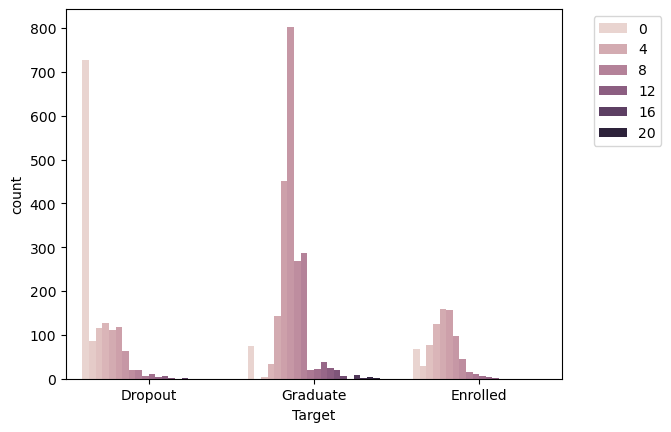

In [35]:
df['Curricular units 2nd sem (approved)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 2nd sem (approved)', legend='auto')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Axes: xlabel='Curricular units 2nd sem (grade)', ylabel='Count'>

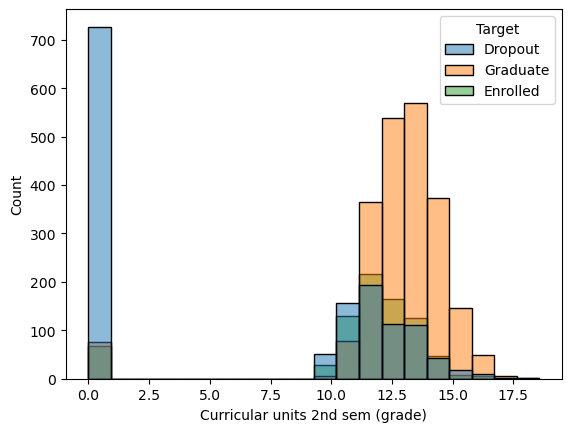

In [36]:
df['Curricular units 2nd sem (grade)'].value_counts()

sns.histplot(data=df, x='Curricular units 2nd sem (grade)', hue='Target', bins = 20)

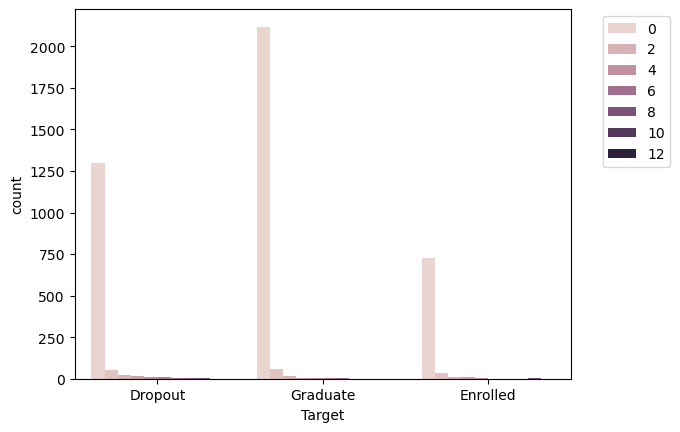

In [37]:
df['Curricular units 2nd sem (without evaluations)'].value_counts()

sns.countplot(x='Target',data=df,hue='Curricular units 2nd sem (without evaluations)', legend='auto')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

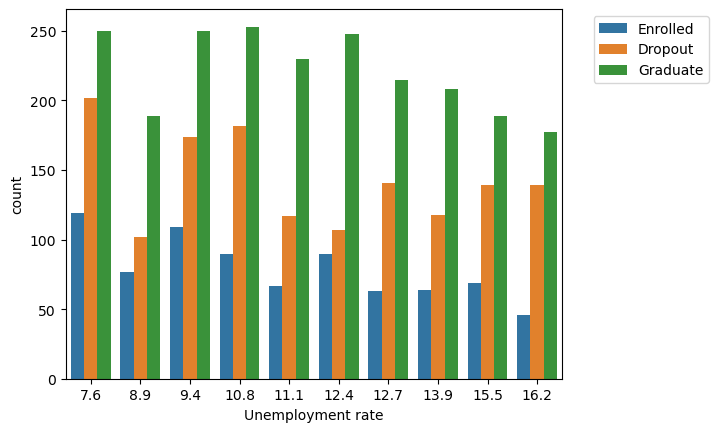

In [38]:
df['Unemployment rate'].value_counts()

sns.countplot(data=df, x='Unemployment rate', hue='Target')
ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

<Axes: xlabel='Inflation rate', ylabel='count'>

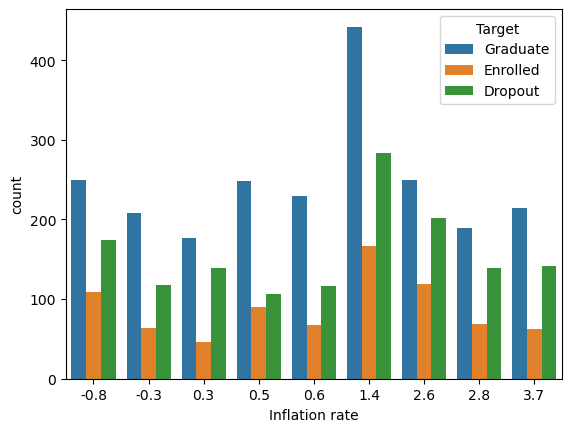

In [39]:
df['Inflation rate'].value_counts()

sns.countplot(data=df, x='Inflation rate', hue='Target')

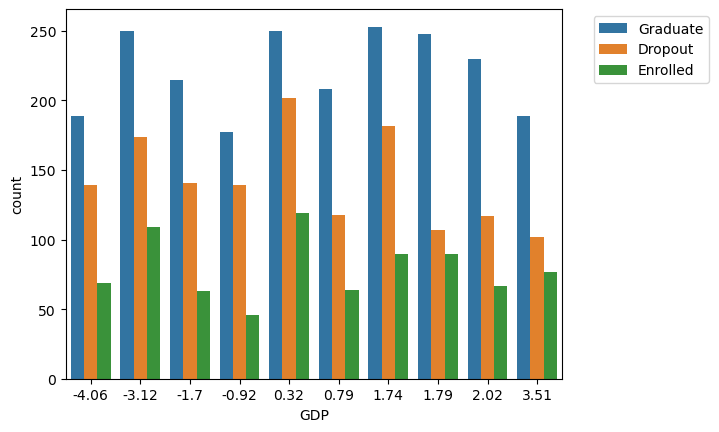

In [40]:
df['GDP'].value_counts()

sns.countplot(data=df, x='GDP', hue='Target')

ax = plt.gca()
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

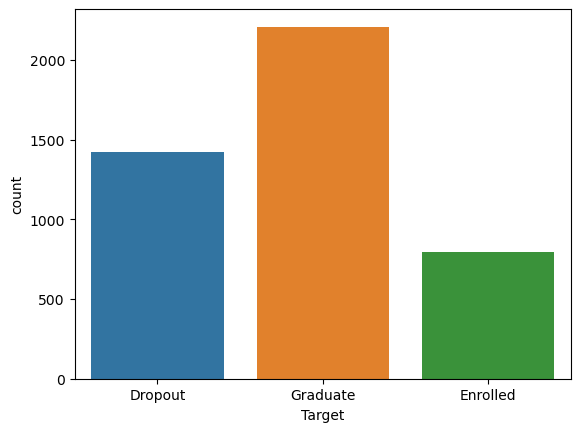

In [41]:
sns.countplot(x='Target', hue='Target',data=df)
plt.show()

<Axes: xlabel='Curricular units 2nd sem (grade)', ylabel='Curricular units 1st sem (grade)'>

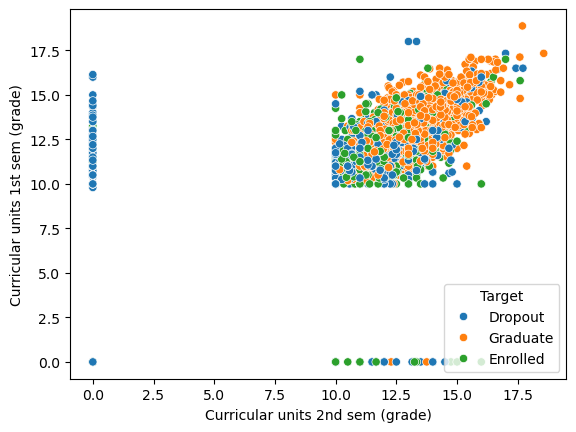

In [42]:
sns.scatterplot(x='Curricular units 2nd sem (grade)',y='Curricular units 1st sem (grade)' ,hue='Target',data=df)

<Axes: xlabel='Curricular units 2nd sem (approved)', ylabel='Curricular units 1st sem (approved)'>

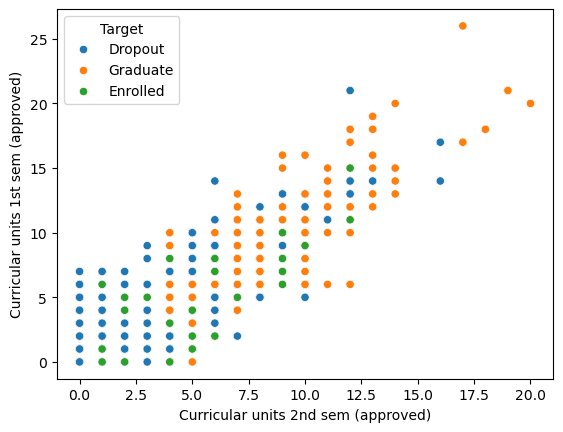

In [43]:
sns.scatterplot(x='Curricular units 2nd sem (approved)',y='Curricular units 1st sem (approved)' ,hue='Target',data=df)

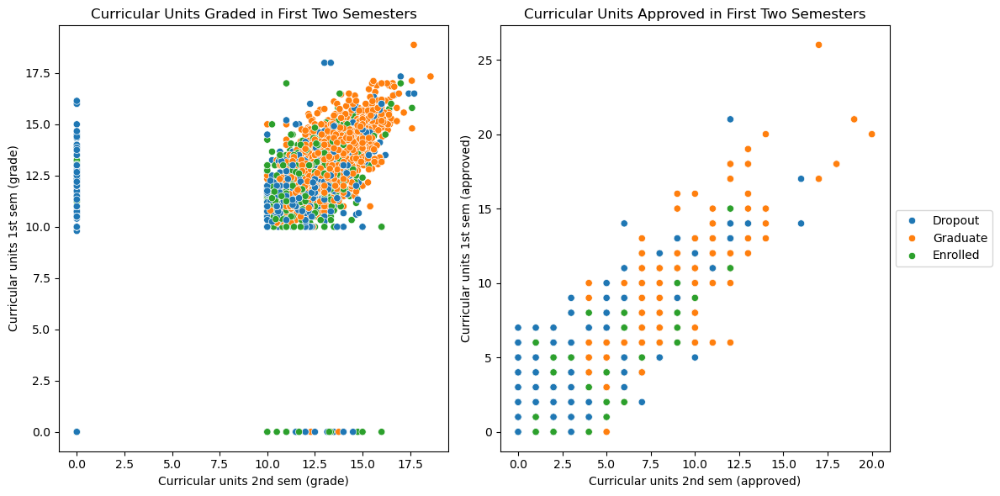

In [44]:
# Create a figure with two subplots in one row and two columns
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Scatter plot 1 with no legend
sns.scatterplot(x='Curricular units 2nd sem (grade)', y='Curricular units 1st sem (grade)',
                hue='Target', data=df, ax=axes[0], legend=False)
axes[0].set_title('Curricular Units Graded in First Two Semesters')

# Scatter plot 2
sns.scatterplot(x='Curricular units 2nd sem (approved)', y='Curricular units 1st sem (approved)',
                hue='Target', data=df, ax=axes[1])
axes[1].set_title('Curricular Units Approved in First Two Semesters')

# Add a common legend to the right
axes[1].legend(loc='center left', bbox_to_anchor=(1, 0.5))

# Adjust layout
plt.tight_layout()
plt.show()

In [45]:
round(y.value_counts()/sum(y.value_counts()),3)*100

Target  
Graduate    49.9
Dropout     32.1
Enrolled    17.9
dtype: float64

In [46]:
sns.set_style(style='darkgrid')

In [47]:
#sns.pairplot(df,hue='Target') # 'Target_N' is the response
#plt.show()

In [48]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Marital Status,4424.0,1.178571,0.605747,1.00,1.00,1.000000,1.000000,6.000000
Application mode,4424.0,18.669078,17.484682,1.00,1.00,17.000000,39.000000,57.000000
Application order,4424.0,1.727848,1.313793,0.00,1.00,1.000000,2.000000,9.000000
Course,4424.0,8856.642631,2063.566416,33.00,9085.00,9238.000000,9556.000000,9991.000000
Daytime/evening attendance,4424.0,0.890823,0.311897,0.00,1.00,1.000000,1.000000,1.000000
Previous qualification,4424.0,4.577758,10.216592,1.00,1.00,1.000000,1.000000,43.000000
Previous qualification (grade),4424.0,132.613314,13.188332,95.00,125.00,133.100000,140.000000,190.000000
Nacionality,4424.0,1.873192,6.914514,1.00,1.00,1.000000,1.000000,109.000000
Mother's qualification,4424.0,19.561935,15.603186,1.00,2.00,19.000000,37.000000,44.000000
Father's qualification,4424.0,22.275316,15.343108,1.00,3.00,19.000000,37.000000,44.000000


<Axes: >

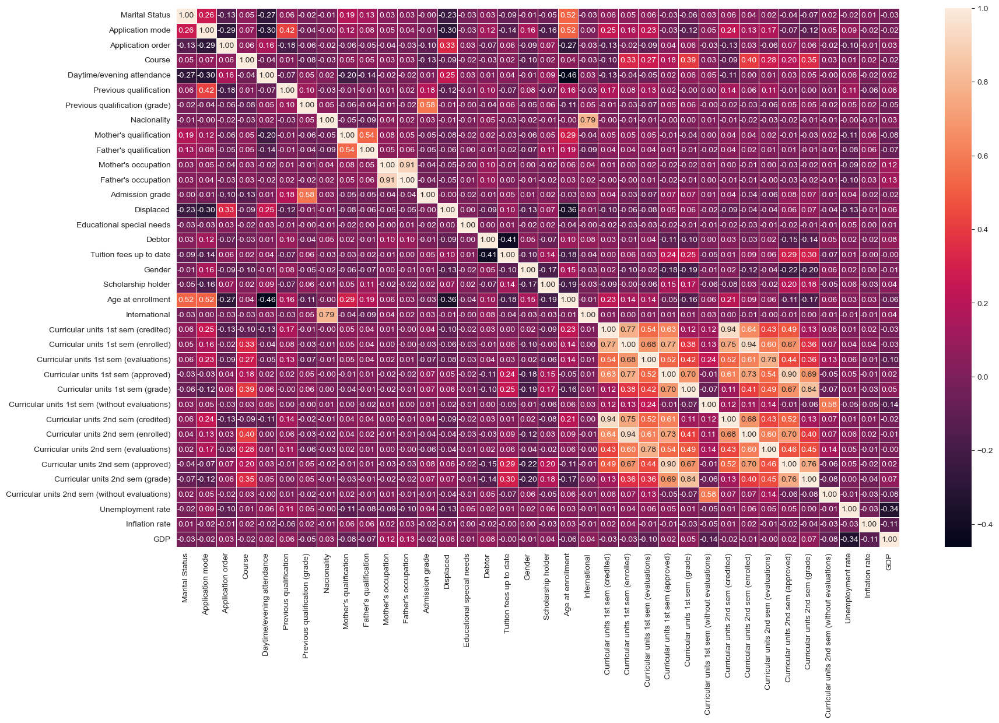

In [49]:
# heatmap
plt.figure(figsize = (20,12))
sns.heatmap(df.corr(numeric_only=True), annot=True, fmt=".2f", linewidths=.5)

<Axes: >

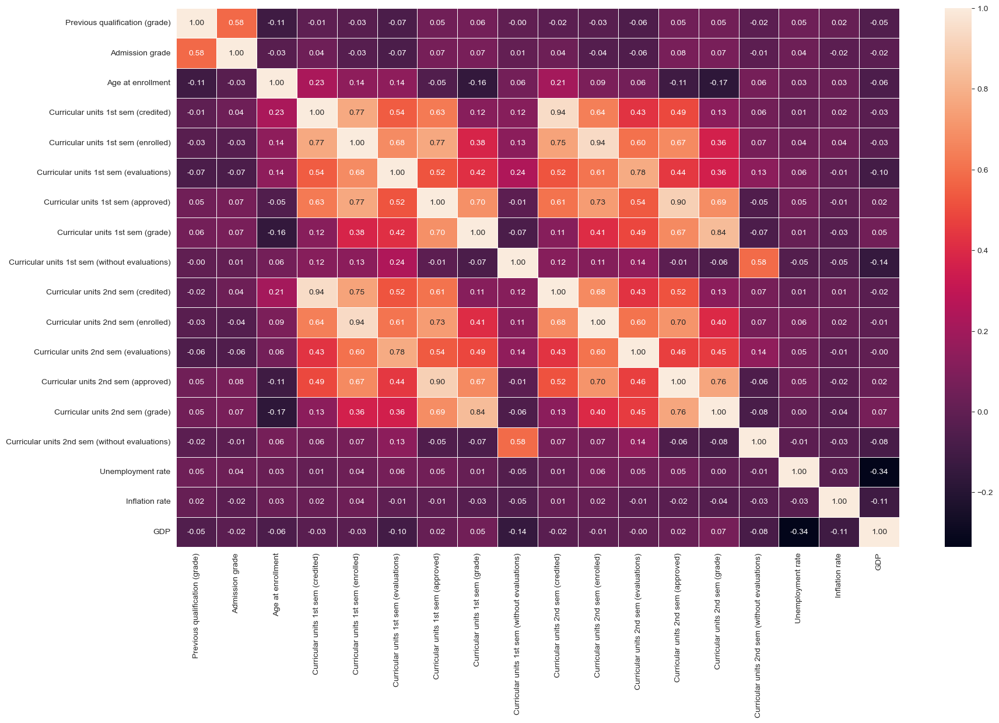

In [50]:
plt.figure(figsize = (20,12))
Numeric = X[['Previous qualification (grade)', 'Admission grade', 'Age at enrollment', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)',  'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)', 'Unemployment rate', 'Inflation rate', 'GDP']]
sns.heatmap(Numeric.corr(numeric_only=True), annot=True, fmt=".2f", linewidths=.5)

In [51]:
all_columns = df.columns
numeric_columns = ['Previous qualification (grade)', 'Admission grade', 'Age at enrollment', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)',  'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)', 'Unemployment rate', 'Inflation rate', 'GDP']
categorical_columns = [col for col in all_columns if col not in numeric_columns]

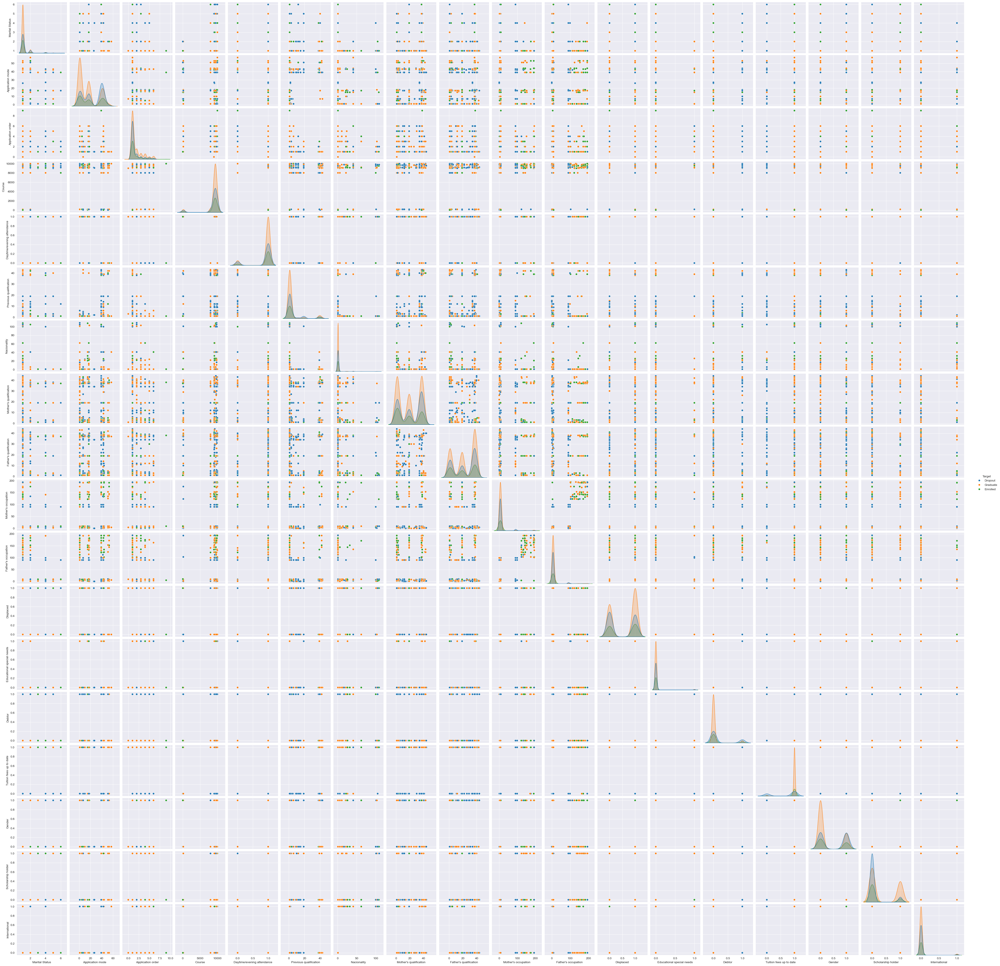

In [52]:
Categorical = df[categorical_columns]
sns.pairplot(Categorical, hue='Target')

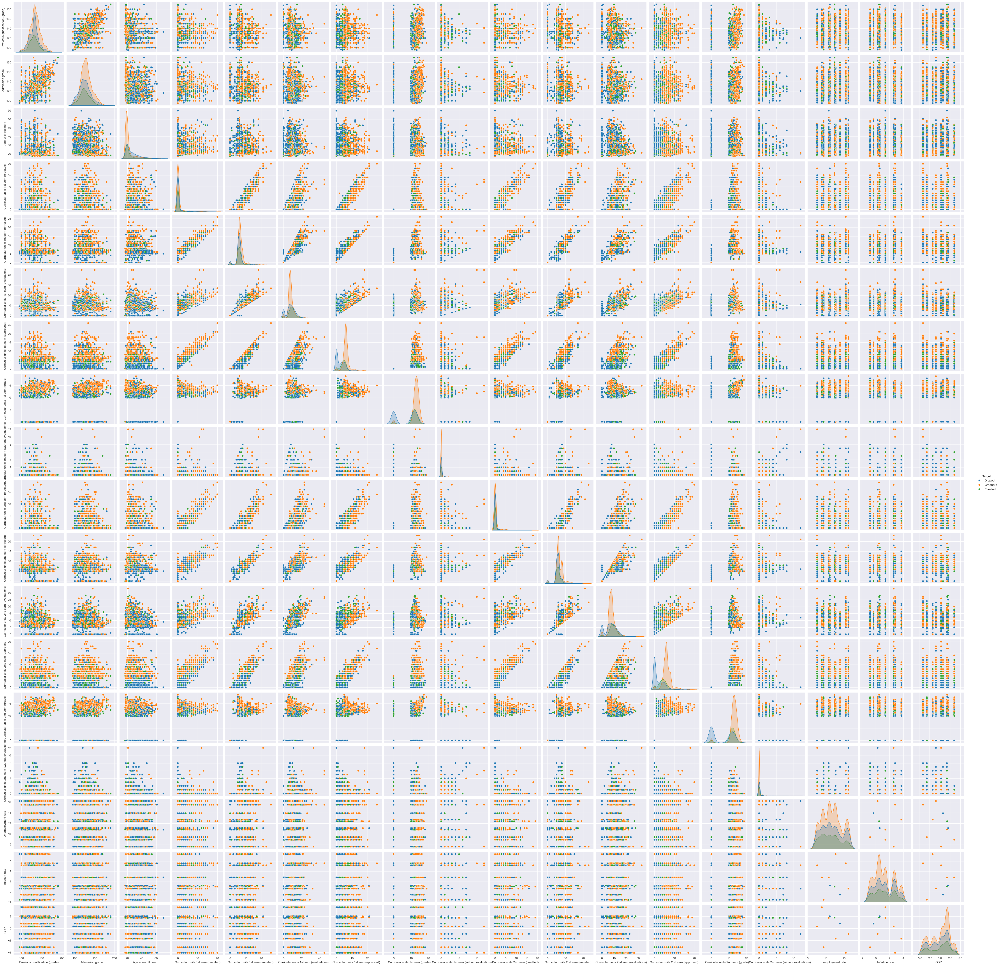

In [53]:
Numeric = pd.concat([Numeric, y], axis=1)
sns.pairplot(Numeric, hue='Target')

In [54]:
# Mapping target to integers
df['Target_N'] = df['Target'].map({'Graduate': 1, 'Dropout': 2, 'Enrolled': 3})
df.drop(columns=['Target'], inplace=True)
df.head()

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target_N
0,1,17,5,171,1,1,122.0,1,19,12,...,0,0,0,0,0.000000,0,10.8,1.4,1.74,2
1,1,15,1,9254,1,1,160.0,1,1,3,...,0,6,6,6,13.666667,0,13.9,-0.3,0.79,1
2,1,1,5,9070,1,1,122.0,1,37,37,...,0,6,0,0,0.000000,0,10.8,1.4,1.74,2
3,1,17,2,9773,1,1,122.0,1,38,37,...,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,1
4,2,39,1,8014,0,1,100.0,1,37,38,...,0,6,6,6,13.000000,0,13.9,-0.3,0.79,1


In [55]:
Categorical.columns

Index(['Marital Status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance', 'Previous qualification', 'Nacionality',
       'Mother's qualification', 'Father's qualification',
       'Mother's occupation', 'Father's occupation', 'Displaced',
       'Educational special needs', 'Debtor', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'International', 'Target'],
      dtype='object')

In [56]:
columns_to_encode = ['Marital Status', 'Application mode', 'Application order', 'Course',
       'Daytime/evening attendance', 'Previous qualification', 'Nacionality',
       'Mother\'s qualification', 'Father\'s qualification',
       'Mother\'s occupation', 'Father\'s occupation', 'Displaced',
       'Educational special needs', 'Debtor', 'Tuition fees up to date',
       'Gender', 'Scholarship holder', 'International']
columns_to_encode
df_encoded = pd.get_dummies(df, columns=columns_to_encode, drop_first=True)
df_encoded.head()

,Previous qualification (grade),Admission grade,Age at enrollment,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),...,Father's occupation_193,Father's occupation_194,Father's occupation_195,Displaced_1,Educational special needs_1,Debtor_1,Tuition fees up to date_1,Gender_1,Scholarship holder_1,International_1
0,122.0,127.3,20,0,0,0,0,0.000000,0,0,...,0,0,0,1,0,0,1,1,0,0
1,160.0,142.5,19,0,6,6,6,14.000000,0,0,...,0,0,0,1,0,0,0,1,0,0
2,122.0,124.8,19,0,6,0,0,0.000000,0,0,...,0,0,0,1,0,0,0,1,0,0
3,122.0,119.6,20,0,6,8,6,13.428571,0,0,...,0,0,0,1,0,0,1,0,0,0
4,100.0,141.5,45,0,6,9,5,12.333333,0,0,...,0,0,0,0,0,0,1,0,0,0


In [57]:
all_columns = df_encoded.columns
numeric_columns = ['Previous qualification (grade)', 'Admission grade', 'Age at enrollment', 'Curricular units 1st sem (credited)', 'Curricular units 1st sem (enrolled)', 'Curricular units 1st sem (evaluations)', 'Curricular units 1st sem (approved)', 'Curricular units 1st sem (grade)', 'Curricular units 1st sem (without evaluations)',  'Curricular units 2nd sem (credited)', 'Curricular units 2nd sem (enrolled)', 'Curricular units 2nd sem (evaluations)', 'Curricular units 2nd sem (approved)', 'Curricular units 2nd sem (grade)', 'Curricular units 2nd sem (without evaluations)', 'Unemployment rate', 'Inflation rate', 'GDP']
categorical_columns = [col for col in all_columns if col not in numeric_columns]

In [ ]:
# scaling features for machine learning models
scaler = StandardScaler()
scaler.fit(df_encoded[numeric_columns])
scaled_features = scaler.transform(df_encoded[numeric_columns])

In [59]:
df_num_feat = pd.DataFrame(scaled_features,columns=numeric_columns) # create new df with scaled features
df_cat_feat = df_encoded[categorical_columns] # cat cols
# reordering data so target is at the end
resp = df_cat_feat.iloc[:,0]
other_cols = df_cat_feat.iloc[:,1:]
df_cat_reordered = pd.concat([other_cols, resp], axis=1)
#df_cat_reordered.head()
df_clean = pd.concat([df_num_feat, df_cat_reordered], axis=1)
df_clean.head()

,Previous qualification (grade),Admission grade,Age at enrollment,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),...,Father's occupation_194,Father's occupation_195,Displaced_1,Educational special needs_1,Debtor_1,Tuition fees up to date_1,Gender_1,Scholarship holder_1,International_1,Target_N
0,-0.804841,0.022229,-0.430363,-0.300813,-2.528560,-1.986068,-1.521257,-2.197102,-0.199273,-0.282442,...,0,0,1,0,0,1,1,0,0,2
1,2.076819,1.071926,-0.562168,-0.300813,-0.109105,-0.550192,0.418050,0.693599,-0.199273,-0.282442,...,0,0,1,0,0,0,1,0,0,1
2,-0.804841,-0.150419,-0.562168,-0.300813,-0.109105,-1.986068,-1.521257,-2.197102,-0.199273,-0.282442,...,0,0,1,0,0,0,1,0,0,2
3,-0.804841,-0.509526,-0.430363,-0.300813,-0.109105,-0.071567,0.418050,0.575611,-0.199273,-0.282442,...,0,0,1,0,0,1,0,0,0,1
4,-2.473171,1.002867,2.864765,-0.300813,-0.109105,0.167746,0.094832,0.349468,-0.199273,-0.282442,...,0,0,0,0,0,1,0,0,0,1


In [60]:
## Set aside the Enrolled level
df_clean_enrolled = df_encoded[df_encoded['Target_N']==3].copy()

# Remove from the original data
df_clean.drop(df_clean[df_clean['Target_N']==3].index, inplace=True)

In [ ]:
# Verify Enrolled is dropped
df_clean['Target_N'].unique()

array([2, 1], dtype=int64)

In [62]:
X = df_clean.drop(columns=['Target_N'])
y = df_clean['Target_N']

In [63]:
df_clean.shape

(3630, 245)

In [64]:
# Import Classification Modules
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.neighbors import KNeighborsClassifier # from lab1
from sklearn.model_selection import GridSearchCV # from HW 4- decision trees
from sklearn.svm import SVC # from hw 5
from sklearn.tree import DecisionTreeClassifier

In [65]:
# First split, 70/30 for train/test
X_train_val, X_test_final, y_train_val, y_test_final = train_test_split(
    X, y, test_size=0.3, random_state=6
)

# Second nested split for testing final models
X_bootstrap_train, X_bootstrap_test, y_bootstrap_train, y_bootstrap_test = train_test_split(
    X_test_final, y_test_final, test_size=0.1, random_state=6
)

## SVM

#### First, test with different types of kernels

In [66]:
svm_model_rbf = SVC(kernel='rbf', class_weight='balanced', random_state=6) # balance class weights based on EDA

In [67]:
svm_model_rbf.fit(X_train_val, np.ravel(y_train_val))

SVC(class_weight='balanced', random_state=6)

In [68]:
svm_model_lin = SVC(kernel='linear', class_weight='balanced', random_state=6)

In [69]:
svm_model_lin.fit(X_train_val, np.ravel(y_train_val))

SVC(class_weight='balanced', kernel='linear', random_state=6)

In [70]:
svm_model_poly = SVC(kernel='poly', class_weight='balanced', random_state=6)

In [71]:
svm_model_poly.fit(X_train_val, np.ravel(y_train_val))

SVC(class_weight='balanced', kernel='poly', random_state=6)

In [72]:
y_pred = svm_model_poly.predict(X_bootstrap_train)

In [73]:
print(confusion_matrix(y_bootstrap_train,y_pred)) 

[[558  30]
 [ 82 310]]


In [74]:
print(classification_report(y_bootstrap_train, y_pred)) 

              precision    recall  f1-score   support

           1       0.87      0.95      0.91       588
           2       0.91      0.79      0.85       392

    accuracy                           0.89       980
   macro avg       0.89      0.87      0.88       980
weighted avg       0.89      0.89      0.88       980



In [75]:
y_pred = svm_model_rbf.predict(X_bootstrap_train)

In [76]:
print(confusion_matrix(y_bootstrap_train,y_pred)) #!

[[560  28]
 [ 53 339]]


In [77]:
print(classification_report(y_bootstrap_train, y_pred)) #!

              precision    recall  f1-score   support

           1       0.91      0.95      0.93       588
           2       0.92      0.86      0.89       392

    accuracy                           0.92       980
   macro avg       0.92      0.91      0.91       980
weighted avg       0.92      0.92      0.92       980



In [78]:
y_pred = svm_model_lin.predict(X_bootstrap_train)

In [79]:
print(confusion_matrix(y_bootstrap_train,y_pred))

[[542  46]
 [ 57 335]]


In [80]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.90      0.92      0.91       588
           2       0.88      0.85      0.87       392

    accuracy                           0.89       980
   macro avg       0.89      0.89      0.89       980
weighted avg       0.89      0.89      0.89       980



In [81]:
param_grid = {
    'C': [0.1,1, 10, 100, 1000], 
    'gamma': [1,0.1,0.01,0.001,0.0001], 
    'kernel': ['rbf','poly','linear', 'sigmoid']
} 

In [83]:
svm_model_gs = SVC()
grid_search = GridSearchCV(svm_model_gs, param_grid, cv=5, scoring='f1_weighted', n_jobs=15)
grid_search.fit(X_train_val, np.ravel(y_train_val))

GridSearchCV(cv=5, estimator=SVC(), n_jobs=15,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf', 'poly', 'linear', 'sigmoid']},
             scoring='f1_weighted')

In [84]:
print(grid_search.best_params_)
print(grid_search.best_score_)

{'C': 1, 'gamma': 1, 'kernel': 'linear'}
0.9110680214373786


In [85]:
best_params = grid_search.best_params_
svm_model_gs = SVC(**best_params, class_weight='balanced', random_state=6)
svm_model_gs.fit(X_train_val, np.ravel(y_train_val))

SVC(C=1, class_weight='balanced', gamma=1, kernel='linear', random_state=6)

In [86]:
y_pred = svm_model_gs.predict(X_bootstrap_train)

In [87]:
print(confusion_matrix(y_bootstrap_train, y_pred)) #2

[[542  46]
 [ 57 335]]


In [88]:
print(classification_report(y_bootstrap_train, y_pred)) #2

              precision    recall  f1-score   support

           1       0.90      0.92      0.91       588
           2       0.88      0.85      0.87       392

    accuracy                           0.89       980
   macro avg       0.89      0.89      0.89       980
weighted avg       0.89      0.89      0.89       980



## KNN

In [89]:
## KNN
from sklearn.neighbors import KNeighborsClassifier
# Test with KNN1
# Do an error chart by increasing k

In [90]:
knn = KNeighborsClassifier(n_neighbors=1)

In [91]:
knn.fit(X_train_val,y_train_val)

KNeighborsClassifier(n_neighbors=1)

In [92]:
y_pred = knn.predict(X_bootstrap_train)

In [93]:
print(confusion_matrix(y_bootstrap_train,y_pred))

[[521  67]
 [110 282]]


In [94]:
print(classification_report(y_bootstrap_train,y_pred))

              precision    recall  f1-score   support

           1       0.83      0.89      0.85       588
           2       0.81      0.72      0.76       392

    accuracy                           0.82       980
   macro avg       0.82      0.80      0.81       980
weighted avg       0.82      0.82      0.82       980



In [95]:
error_rate = []
for i in range(1,50):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train_val,y_train_val)
    pred_i = knn.predict(X_bootstrap_train)
    error_rate.append(np.mean(pred_i!=y_bootstrap_train)) # mean of prediction different from test label

Text(0, 0.5, 'Error Rate')

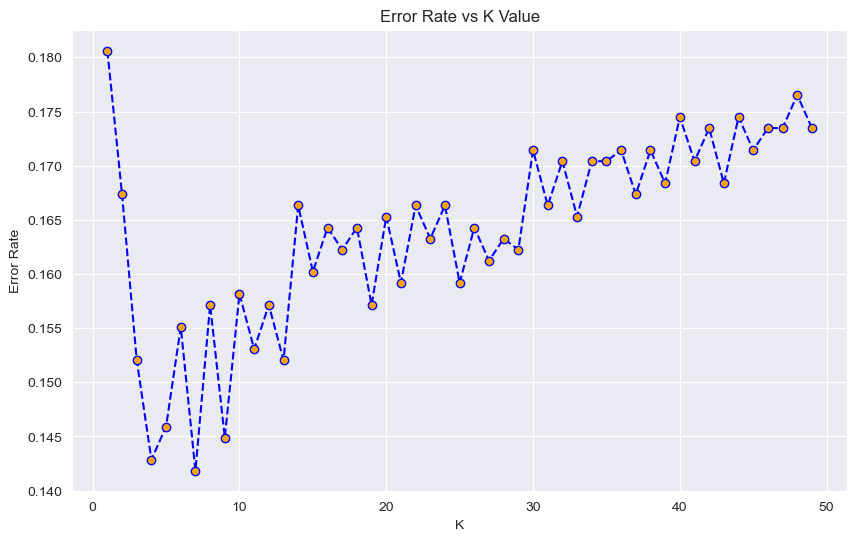

In [96]:
plt.figure(figsize=(10,6))
plt.plot(range(1,50),error_rate,color='blue',ls='dashed',marker='o',markerfacecolor='orange',markersize=6)
plt.title('Error Rate vs K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [ ]:
knn7 = KNeighborsClassifier(n_neighbors=7) # lowest error rate occurs when k = 7

In [98]:
knn7.fit(X_train_val, y_train_val)

KNeighborsClassifier(n_neighbors=7)

In [99]:
y_pred = knn7.predict(X_bootstrap_train)

In [100]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[564  24]
 [115 277]]


In [101]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.83      0.96      0.89       588
           2       0.92      0.71      0.80       392

    accuracy                           0.86       980
   macro avg       0.88      0.83      0.84       980
weighted avg       0.87      0.86      0.85       980



In [102]:
params = {'n_neighbors': list(range(1,31)), 'leaf_size': list(range(20,41)), 'metric': ['minkowski'], 'p': list(range(1,5))}

In [103]:
knn_GS = KNeighborsClassifier(algorithm='auto')
grid = GridSearchCV(estimator=knn_GS, param_grid=params, scoring='f1_weighted', cv=5, n_jobs=15)
grid.fit(X_train_val, y_train_val)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=15,
             param_grid={'leaf_size': [20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
                                       30, 31, 32, 33, 34, 35, 36, 37, 38, 39,
                                       40],
                         'metric': ['minkowski'],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29, 30],
                         'p': [1, 2, 3, 4]},
             scoring='f1_weighted')

In [104]:
best_params = grid.best_params_
best_score = grid.best_score_
print('Best params:', best_params)
print('Best score:', best_score)

Best params: {'leaf_size': 20, 'metric': 'minkowski', 'n_neighbors': 9, 'p': 2}
Best score: 0.8475575506923441


In [105]:
knn_gs = KNeighborsClassifier(**best_params)

In [106]:
knn_gs.fit(X_train_val, y_train_val)

KNeighborsClassifier(leaf_size=20, n_neighbors=9)

In [107]:
y_pred = knn_gs.predict(X_bootstrap_train)

In [108]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[567  21]
 [121 271]]


In [109]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.82      0.96      0.89       588
           2       0.93      0.69      0.79       392

    accuracy                           0.86       980
   macro avg       0.88      0.83      0.84       980
weighted avg       0.87      0.86      0.85       980



## Naive Bayes

In [110]:
from sklearn.naive_bayes import GaussianNB

In [111]:
gnb = GaussianNB()
gnb.fit(X_train_val, y_train_val)

GaussianNB()

In [112]:
y_pred = gnb.predict(X_bootstrap_train)

In [113]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[ 27 561]
 [ 13 379]]


In [114]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.68      0.05      0.09       588
           2       0.40      0.97      0.57       392

    accuracy                           0.41       980
   macro avg       0.54      0.51      0.33       980
weighted avg       0.57      0.41      0.28       980



## Logistic Regression

In [115]:
from sklearn.linear_model import LogisticRegression

In [116]:
logmodel = LogisticRegression(max_iter=100, solver='newton-cg', n_jobs=10, class_weight='balanced') # had to change None to 'none'


In [117]:
logmodel.fit(X_train_val, y_train_val)

LogisticRegression(class_weight='balanced', n_jobs=10, solver='newton-cg')

In [118]:
y_pred = logmodel.predict(X_bootstrap_train)

In [119]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[541  47]
 [ 56 336]]


In [120]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.91      0.92      0.91       588
           2       0.88      0.86      0.87       392

    accuracy                           0.89       980
   macro avg       0.89      0.89      0.89       980
weighted avg       0.89      0.89      0.89       980



In [121]:
params = {
    'C' : [0.01, 0.1, 1, 10, 100], 
    'solver' : ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky']}

In [122]:
log_gs = LogisticRegression(class_weight='balanced')
log_grid = GridSearchCV(estimator=log_gs, param_grid=params, scoring='f1_weighted', cv=5, n_jobs=10)
log_grid.fit(X_train_val, y_train_val)

GridSearchCV(cv=5, estimator=LogisticRegression(class_weight='balanced'),
             n_jobs=10,
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'solver': ['lbfgs', 'liblinear', 'newton-cg',
                                    'newton-cholesky']},
             scoring='f1_weighted')

In [123]:
best_params = log_grid.best_params_
best_score = log_grid.best_score_
print('Best params:', best_params)
print('Best score:', best_score)

Best params: {'C': 0.1, 'solver': 'liblinear'}
Best score: 0.9079126478190496


In [124]:
log_gs = LogisticRegression(**best_params, class_weight='balanced', max_iter=200)
log_gs.fit(X_train_val, y_train_val)

LogisticRegression(C=0.1, class_weight='balanced', max_iter=200,
                   solver='liblinear')

In [125]:
y_pred = log_gs.predict(X_bootstrap_train)

In [ ]:
print(confusion_matrix(y_bootstrap_train, y_pred)) # 1

[[549  39]
 [ 51 341]]


In [ ]:
print(classification_report(y_bootstrap_train, y_pred)) # 1

              precision    recall  f1-score   support

           1       0.92      0.93      0.92       588
           2       0.90      0.87      0.88       392

    accuracy                           0.91       980
   macro avg       0.91      0.90      0.90       980
weighted avg       0.91      0.91      0.91       980



## Decision Tree

In [128]:
from sklearn.tree import DecisionTreeClassifier

In [129]:
dtc = DecisionTreeClassifier(class_weight='balanced', random_state=6)

In [131]:
dtc.fit(X_train_val,y_train_val)

DecisionTreeClassifier(class_weight='balanced', random_state=6)

In [132]:
y_pred = dtc.predict(X_bootstrap_train)

In [133]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[536  52]
 [ 72 320]]


In [134]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.88      0.91      0.90       588
           2       0.86      0.82      0.84       392

    accuracy                           0.87       980
   macro avg       0.87      0.86      0.87       980
weighted avg       0.87      0.87      0.87       980



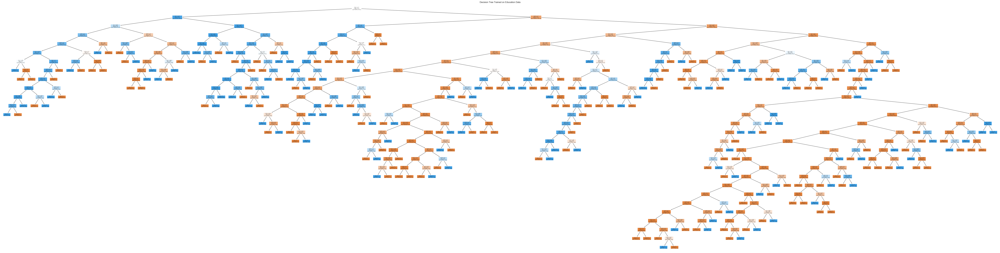

In [135]:
from sklearn.tree import plot_tree

plt.figure(figsize=(96,24))
plot_tree(dtc, filled=True)
plt.title("Decision Tree Trained on Education Data")
plt.show()

In [136]:
params = {
    'criterion' : ['gini', 'entropy', 'log_loss'], 
    'splitter' : ['best', 'random'], 
    'max_features' : ['sqrt', 'log2'], 
    'class_weight' : ['balanced'],
    'ccp_alpha' : [0.0001, 0.001, 0.01, 0.1, 1]
}

In [137]:
dtc_gs = DecisionTreeClassifier(random_state=6)

In [138]:
grid = GridSearchCV(estimator=dtc_gs, param_grid=params, scoring='f1_weighted', cv=5, n_jobs=15)
grid.fit(X_train_val, y_train_val)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=6), n_jobs=15,
             param_grid={'ccp_alpha': [0.0001, 0.001, 0.01, 0.1, 1],
                         'class_weight': ['balanced'],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_features': ['sqrt', 'log2'],
                         'splitter': ['best', 'random']},
             scoring='f1_weighted')

In [139]:
best_params = grid.best_params_
best_score = grid.best_score_
print('Best params:', best_params)
print('Best score:', best_score)

Best params: {'ccp_alpha': 0.001, 'class_weight': 'balanced', 'criterion': 'gini', 'max_features': 'sqrt', 'splitter': 'best'}
Best score: 0.8268373826522417


In [140]:
dtc_gs = DecisionTreeClassifier(**best_params, random_state=6)
dtc_gs.fit(X_train_val, y_train_val)

DecisionTreeClassifier(ccp_alpha=0.001, class_weight='balanced',
                       max_features='sqrt', random_state=6)

In [141]:
y_pred = dtc_gs.predict(X_bootstrap_train)

In [142]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[494  94]
 [ 68 324]]


In [143]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.88      0.84      0.86       588
           2       0.78      0.83      0.80       392

    accuracy                           0.83       980
   macro avg       0.83      0.83      0.83       980
weighted avg       0.84      0.83      0.84       980



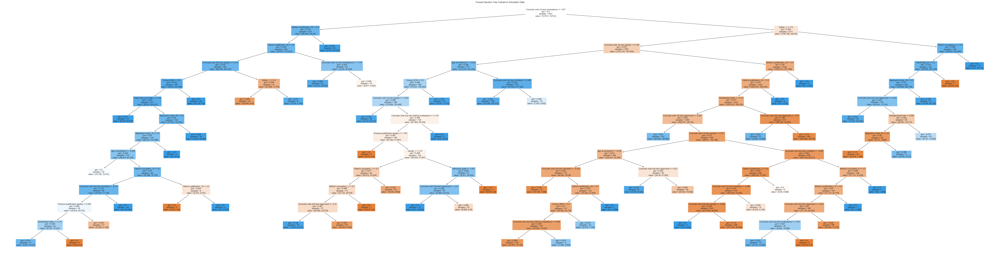

In [144]:
plt.figure(figsize=(96,24))
plot_tree(dtc_gs, filled=True, feature_names=X.columns)
plt.title("Pruned Decision Tree Trained on Education Data")
plt.show()

## Random Forest

In [145]:
from sklearn.ensemble import RandomForestClassifier

In [147]:
rfc = RandomForestClassifier(n_estimators=300, class_weight='balanced')
rfc.fit(X_train_val, y_train_val)

RandomForestClassifier(class_weight='balanced', n_estimators=300)

In [148]:
y_pred = rfc.predict(X_bootstrap_train)

In [149]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[563  25]
 [ 71 321]]


In [150]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.89      0.96      0.92       588
           2       0.93      0.82      0.87       392

    accuracy                           0.90       980
   macro avg       0.91      0.89      0.90       980
weighted avg       0.90      0.90      0.90       980



In [151]:
params = {
    'n_estimators' : [100, 200, 300, 400, 500],
    'criterion' : ['gini', 'entropy', 'log_loss'],
    'max_features' : ['sqrt', 'log2'], 
    'class_weight' : ['balanced', 'balanced_subsample'],
    'ccp_alpha' : [0, 0.01, 0.02, 0.03]
}

In [152]:
rfc_gs = RandomForestClassifier(random_state=6)
grid = GridSearchCV(estimator=rfc_gs, param_grid=params, scoring='f1_weighted', cv=5, n_jobs=15)
grid.fit(X_train_val, y_train_val)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=6), n_jobs=15,
             param_grid={'ccp_alpha': [0, 0.01, 0.02, 0.03],
                         'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [100, 200, 300, 400, 500]},
             scoring='f1_weighted')

In [153]:
best_params = grid.best_params_
best_score = grid.best_score_
print('Best params:', best_params)
print('Best score:', best_score)

Best params: {'ccp_alpha': 0, 'class_weight': 'balanced', 'criterion': 'entropy', 'max_features': 'sqrt', 'n_estimators': 200}
Best score: 0.9062951709822464


In [154]:
rfc_gs = RandomForestClassifier(**best_params, random_state=6)
rfc_gs.fit(X_train_val, y_train_val)

RandomForestClassifier(ccp_alpha=0, class_weight='balanced',
                       criterion='entropy', n_estimators=200, random_state=6)

In [155]:
y_pred = rfc_gs.predict(X_bootstrap_train)

In [156]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[566  22]
 [ 72 320]]


In [ ]:
print(classification_report(y_bootstrap_train, y_pred)) # 2

              precision    recall  f1-score   support

           1       0.89      0.96      0.92       588
           2       0.94      0.82      0.87       392

    accuracy                           0.90       980
   macro avg       0.91      0.89      0.90       980
weighted avg       0.91      0.90      0.90       980



## LDA

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [159]:
lda = LinearDiscriminantAnalysis()

In [161]:
lda.fit(X_train_val, y_train_val)

LinearDiscriminantAnalysis()

In [162]:
y_pred = lda.predict(X_bootstrap_train)

In [163]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[567  21]
 [ 83 309]]


In [164]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.87      0.96      0.92       588
           2       0.94      0.79      0.86       392

    accuracy                           0.89       980
   macro avg       0.90      0.88      0.89       980
weighted avg       0.90      0.89      0.89       980



## Gradient Boosting Classifier

In [170]:
from sklearn.ensemble import GradientBoostingClassifier

In [171]:
boost = GradientBoostingClassifier(random_state=6)

In [172]:
boost.fit(X_train_val, y_train_val)

GradientBoostingClassifier(random_state=6)

In [173]:
y_pred = boost.predict(X_bootstrap_train)

In [174]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[560  28]
 [ 71 321]]


In [175]:
print(classification_report(y_bootstrap_train, y_pred))

              precision    recall  f1-score   support

           1       0.89      0.95      0.92       588
           2       0.92      0.82      0.87       392

    accuracy                           0.90       980
   macro avg       0.90      0.89      0.89       980
weighted avg       0.90      0.90      0.90       980



In [176]:
gb = GradientBoostingClassifier(random_state=6)

In [177]:
params = {
    'n_estimators': [50, 100, 300, 500, 1000, 2000], #
    'learning_rate': [10, 1, 0.1, 0.01, 0.001], #
    'max_depth': [1, 2, 3, 4, 5], # 
    'loss': ['log_loss', 'exponential'],
    'max_features' : ['sqrt', 'log2']
}

In [178]:
grid = GridSearchCV(estimator=gb, param_grid=params, scoring='f1_weighted', cv=5, n_jobs=15)
grid.fit(X_train_val, y_train_val)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=6),
             n_jobs=15,
             param_grid={'learning_rate': [10, 1, 0.1, 0.01, 0.001],
                         'loss': ['log_loss', 'exponential'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [50, 100, 300, 500, 1000, 2000]},
             scoring='f1_weighted')

In [179]:
best_params = grid.best_params_
best_score = grid.best_score_
print('Best params:', best_params)
print('Best score:', best_score)

Best params: {'learning_rate': 0.1, 'loss': 'exponential', 'max_depth': 4, 'max_features': 'log2', 'n_estimators': 1000}
Best score: 0.9123147200585887


In [180]:
gb_gs = GradientBoostingClassifier(**best_params, random_state=6)
gb_gs.fit(X_train_val, y_train_val)

GradientBoostingClassifier(loss='exponential', max_depth=4, max_features='log2',
                           n_estimators=1000, random_state=6)

In [181]:
y_pred = gb_gs.predict(X_bootstrap_train)

In [182]:
print(confusion_matrix(y_bootstrap_train, y_pred))

[[559  29]
 [ 62 330]]


In [ ]:
print(classification_report(y_bootstrap_train, y_pred)) # 3

              precision    recall  f1-score   support

           1       0.90      0.95      0.92       588
           2       0.92      0.84      0.88       392

    accuracy                           0.91       980
   macro avg       0.91      0.90      0.90       980
weighted avg       0.91      0.91      0.91       980



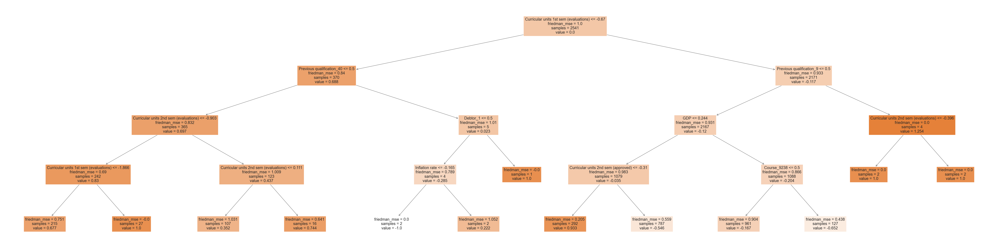

In [184]:
plt.figure(figsize=(96, 24))
plot_tree(gb_gs.estimators_[0][0], filled=True, feature_names=X.columns, class_names=y.unique())
plt.show()

In [185]:
df_clean.shape

(3630, 245)

## Testing

In [ ]:
# Number of bootstrap samples
n_bootstrap = 5000

# Lists to store error rates
test_errors_svm = []
test_errors_gb = []
test_errors_logreg = []
test_errors_rf = []

for i in range(n_bootstrap):
    # Create a bootstrap sample
    bootstrap_indices = np.random.choice(len(X_bootstrap_train), len(X_bootstrap_train), replace=True)
    X_train_bootstrap = X_bootstrap_train.iloc[bootstrap_indices,:]
    y_train_bootstrap = y_bootstrap_train.iloc[bootstrap_indices]

    # Train candidate models
    # SVM-RBF
    model1 = SVC(kernel='rbf', class_weight='balanced', random_state=6) 
    model1.fit(X_train_bootstrap, y_train_bootstrap)
    
    # GBC-GS
    model2 = GradientBoostingClassifier(learning_rate=0.1, 
                                        loss='exponential', max_depth=4,
                                        max_features='log2',
                                        n_estimators=1000, random_state=6)
    model2.fit(X_train_bootstrap, y_train_bootstrap)
    
    # LogReg-GS
    model3 = LogisticRegression(C=0.1, solver='liblinear', max_iter=200, random_state=6)
    model3.fit(X_train_bootstrap, y_train_bootstrap)
    
    # RF
    model4 = RandomForestClassifier(class_weight='balanced',
                       n_estimators=300, random_state=6)
    model4.fit(X_train_bootstrap, y_train_bootstrap)

    # Predict on test set
    y_pred1 = model1.predict(X_bootstrap_test)
    y_pred2 = model2.predict(X_bootstrap_test)
    y_pred3 = model3.predict(X_bootstrap_test)
    y_pred4 = model4.predict(X_bootstrap_test)

    # Calculate and store error rate
    test_error1 = np.mean(y_pred1!=y_bootstrap_test)
    test_error2 = np.mean(y_pred2!=y_bootstrap_test)
    test_error3 = np.mean(y_pred3!=y_bootstrap_test)
    test_error4 = np.mean(y_pred4!=y_bootstrap_test)
    test_errors_svm.append(test_error1)
    test_errors_gb.append(test_error2)
    test_errors_logreg.append(test_error3)
    test_errors_rf.append(test_error4)

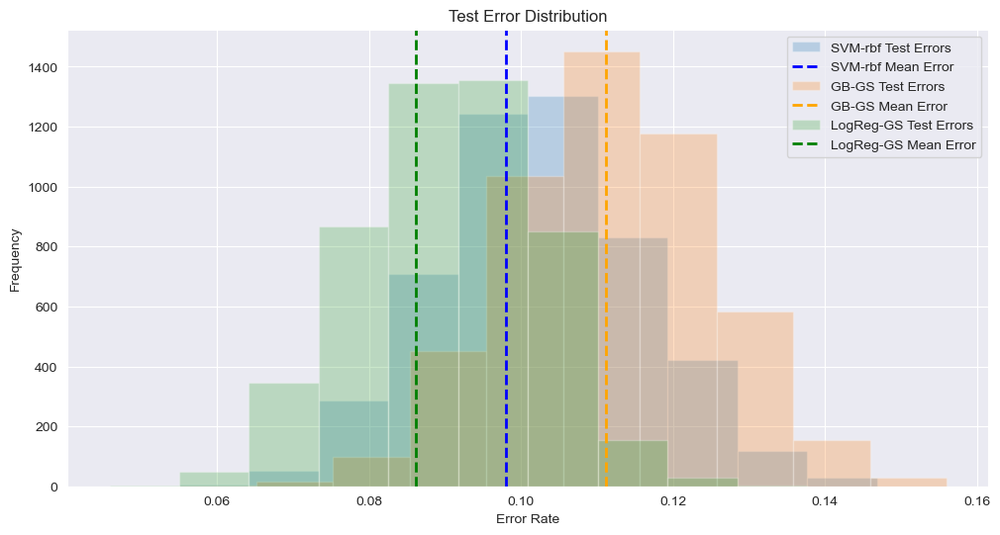

In [192]:
# Plot the distribution of mean squared errors
plt.figure(figsize=(12, 6))

plt.hist(test_errors_svm, alpha=0.25, bins=10, label='SVM-rbf Test Errors')
plt.axvline(np.mean(test_errors_svm), color='blue', linestyle='dashed', linewidth=2, label='SVM-rbf Mean Error')

plt.hist(test_errors_gb, alpha=0.25, bins=10, label='GB-GS Test Errors')
plt.axvline(np.mean(test_errors_gb), color='orange', linestyle='dashed', linewidth=2, label='GB-GS Mean Error')

plt.hist(test_errors_logreg, alpha=0.25, bins=10, label='LogReg-GS Test Errors')
plt.axvline(np.mean(test_errors_logreg), color='green', linestyle='dashed', linewidth=2, label='LogReg-GS Mean Error')

#plt.hist(test_errors_rf, alpha=0.25, bins=10, label='RF Test Errors')
#plt.axvline(np.mean(test_errors_rf), color='red', linestyle='dashed', linewidth=2, label='RF Mean Error')

plt.xlabel('Error Rate')
plt.ylabel('Frequency')
plt.title('Test Error Distribution')
plt.legend()
plt.show()